In [2]:
from google.colab import drive
import os
import pandas as pd

In [3]:
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
os.chdir('/content/drive/MyDrive/BT4222 Project')
os.chdir('Datasets/')

# Preprocessing

### Check for missing values

In [ ]:
# create a function to show missing value info
def get_missing_values_info(df):
    # find missing values in each column
    count_missing = df.isnull().sum()

    # get missing values as percent
    percent_missing = (100 * count_missing / df.shape[0]).round(1)

    # Make dataframe with the results
    missing_df = pd.DataFrame({'Count Missing':count_missing,
                               'Percent Missing':percent_missing})

    # sort values by percent missing
    missing_df = missing_df.sort_values('Percent Missing', ascending=False)

    # find percent of columns with missing values and compare to total number of columns
    missing_values_list = df.columns[df.isnull().any()].tolist()
    cols_missing_vals = len(missing_values_list)
    df_cols = df.shape[1]

    print(f'Length of df: {len(df)}')
    print(f'Columns With Missing Values: {cols_missing_vals}')
    print(f'Total Columns: {df_cols}')
    print(f'Percent of Columns with Missing Values: {round(cols_missing_vals/df_cols*100,1)}%')
    missing_df = missing_df[missing_df['Count Missing'] > 0]
    return missing_df

# TMDB

In [ ]:
movies_df = pd.read_csv('tmdb/tmdb_5000_movies.csv')
credits_df = pd.read_csv('tmdb/tmdb_5000_credits.csv')
tmdb_merged_df = credits_df.merge(movies_df, left_on=['movie_id', 'title'], right_on=['id', 'title'], how='inner')

tmdb_merged_df.head()

,movie_id,title,cast,crew,budget,genres,homepage,id,keywords,original_language,...,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,vote_average,vote_count
0,19995,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de...",237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,...,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,7.2,11800
1,285,Pirates of the Caribbean: At World's End,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de...",300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,...,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",6.9,4500
2,206647,Spectre,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de...",245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,...,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,6.3,4466
3,49026,The Dark Knight Rises,"[{""cast_id"": 2, ""character"": ""Bruce Wayne / Ba...","[{""credit_id"": ""52fe4781c3a36847f81398c3"", ""de...",250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,...,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,1084939099,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,7.6,9106
4,49529,John Carter,"[{""cast_id"": 5, ""character"": ""John Carter"", ""c...","[{""credit_id"": ""52fe479ac3a36847f813eaa3"", ""de...",260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,...,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,284139100,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",6.1,2124


In [ ]:
movies_df.describe()

,budget,id,popularity,revenue,runtime,vote_average,vote_count
count,4.803000e+03,4803.000000,4803.000000,4.803000e+03,4801.000000,4803.000000,4803.000000
mean,2.904504e+07,57165.484281,21.492301,8.226064e+07,106.875859,6.092172,690.217989
std,4.072239e+07,88694.614033,31.816650,1.628571e+08,22.611935,1.194612,1234.585891
min,0.000000e+00,5.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,7.900000e+05,9014.500000,4.668070,0.000000e+00,94.000000,5.600000,54.000000
50%,1.500000e+07,14629.000000,12.921594,1.917000e+07,103.000000,6.200000,235.000000
75%,4.000000e+07,58610.500000,28.313505,9.291719e+07,118.000000,6.800000,737.000000
max,3.800000e+08,459488.000000,875.581305,2.787965e+09,338.000000,10.000000,13752.000000


In [ ]:
credits_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   movie_id  4803 non-null   int64 
 1   title     4803 non-null   object
 2   cast      4803 non-null   object
 3   crew      4803 non-null   object
dtypes: int64(1), object(3)
memory usage: 150.2+ KB


In [ ]:
tmdb_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4803 entries, 0 to 4802
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   movie_id              4803 non-null   int64  
 1   title                 4803 non-null   object 
 2   cast                  4803 non-null   object 
 3   crew                  4803 non-null   object 
 4   budget                4803 non-null   int64  
 5   genres                4803 non-null   object 
 6   homepage              1712 non-null   object 
 7   id                    4803 non-null   int64  
 8   keywords              4803 non-null   object 
 9   original_language     4803 non-null   object 
 10  original_title        4803 non-null   object 
 11  overview              4800 non-null   object 
 12  popularity            4803 non-null   float64
 13  production_companies  4803 non-null   object 
 14  production_countries  4803 non-null   object 
 15  release_date         

Check for missing values

In [ ]:
get_missing_values_info(tmdb_merged_df)

Length of df: 4803
Columns With Missing Values: 5
Total Columns: 23
Percent of Columns with Missing Values: 21.7%


,Count Missing,Percent Missing
homepage,3091,64.4
tagline,844,17.6
overview,3,0.1
runtime,2,0.0
release_date,1,0.0


## Data cleaning

In [ ]:
from ast import literal_eval
def get_text(text, obj='name'):
    text = literal_eval(text)
    # Replace empty list with empty string
    if not text:
        return ''

    if len(text) == 1:
        for i in text:
            return i[obj]
    else:
        s = []
        for i in text:
            s.append(i[obj])
        return ', '.join(s)

tmdb_merged_df['genres'] = tmdb_merged_df['genres'].apply(get_text)
tmdb_merged_df['crew'] = tmdb_merged_df['crew'].apply(get_text)
tmdb_merged_df['cast'] = tmdb_merged_df['cast'].apply(get_text)
tmdb_merged_df['keywords'] = tmdb_merged_df['keywords'].apply(get_text)
tmdb_merged_df['spoken_languages'] = tmdb_merged_df['spoken_languages'].apply(get_text)
tmdb_merged_df['production_companies'] = tmdb_merged_df['production_companies'].apply(get_text)
tmdb_merged_df['production_countries'] = tmdb_merged_df['production_countries'].apply(get_text)

In [ ]:
tmdb_merged_df['homepage'] = tmdb_merged_df['homepage'].fillna('')
tmdb_merged_df['tagline'] = tmdb_merged_df['tagline'].fillna('')
tmdb_merged_df['overview'] = tmdb_merged_df['overview'].fillna('')

tmdb_merged_df['release_date'] = pd.to_datetime(tmdb_merged_df['release_date'])
tmdb_merged_df['release_date'] = tmdb_merged_df['release_date'].fillna('')

tmdb_merged_df['runtime'] = tmdb_merged_df['runtime'].fillna(0)

In [ ]:
get_missing_values_info(tmdb_merged_df)

Length of df: 4803
Columns With Missing Values: 1
Total Columns: 23
Percent of Columns with Missing Values: 4.3%


,Count Missing,Percent Missing
release_date,1,0.0


GloVe on 'overview' column

In [ ]:
import numpy as np
import pandas as pd
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string
import zipfile

# Unzip the GloVe file
with zipfile.ZipFile('glove.6B.zip', 'r') as zip_ref:
    zip_ref.extractall('glove')

# Load GloVe model
def load_glove_model(glove_file):
    print("Loading Glove Model")
    with open(glove_file, 'r', encoding='utf8') as f:
        model = {}
        for line in f:
            split_line = line.split()
            word = split_line[0]
            embedding = np.array([float(val) for val in split_line[1:]])
            model[word] = embedding
        print("Done.", len(model), " words loaded!")
        return model

glove_model = load_glove_model('glove/glove.6B.300d.txt')

Loading Glove Model
Done. 400001  words loaded!


In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')

# Preprocess text
def preprocess_text(text):
    text = text.lower()  # convert to lowercase
    text = re.sub(r'\d+', '', text)  # remove numbers
    text = text.translate(str.maketrans('', '', string.punctuation))  # remove punctuation
    tokens = word_tokenize(text)  # tokenize
    tokens = [word for word in tokens if word not in stopwords.words('english')]  # remove stopwords
    return tokens

# Convert overviews to word embeddings
def overview_to_embedding(overview):
    words = preprocess_text(overview)
    embeddings = [glove_model.get(word, np.zeros(300)) for word in words]
    if len(embeddings) == 0:
        return np.zeros(300)
    return np.mean(embeddings, axis=0)


# Create new feature
tmdb_merged_df['overview_embedding'] = tmdb_merged_df['overview'].apply(overview_to_embedding)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
len(tmdb_merged_df['overview_embedding'][0])

300

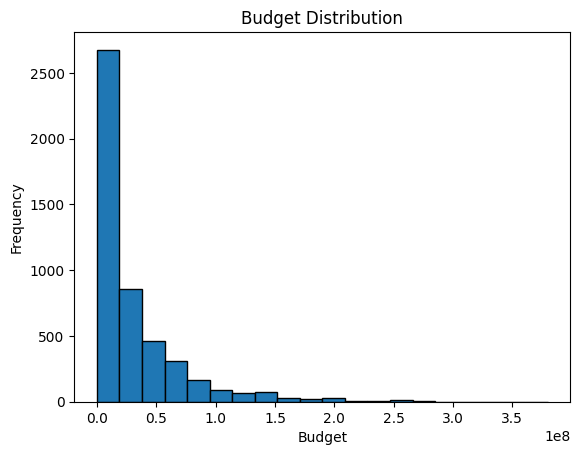

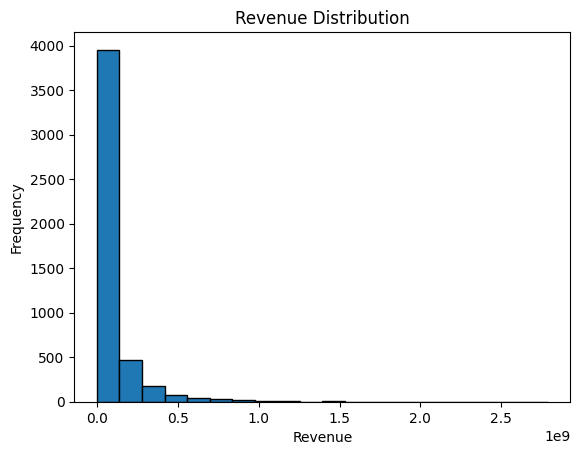

In [ ]:
import matplotlib.pyplot as plt

plt.hist(tmdb_merged_df['budget'], bins=20, edgecolor='k')
plt.xlabel("Budget")
plt.ylabel("Frequency")
plt.title("Budget Distribution")
plt.show()

plt.hist(tmdb_merged_df['revenue'], bins=20, edgecolor='k')
plt.xlabel("Revenue")
plt.ylabel("Frequency")
plt.title("Revenue Distribution")
plt.show()

In [ ]:
tmdb_merged_df

In [ ]:
tmdb_merged_df.to_csv('tmdb/tmdb_merged_cleaned.csv', na_rep=None, index=False)

In [ ]:
different_titles = tmdb_merged_df[tmdb_merged_df['title'] != tmdb_merged_df['original_title']]
different_titles[['title', 'original_title']]

,title,original_title
97,Shin Godzilla,シン・ゴジラ
215,Fantastic 4: Rise of the Silver Surfer,4: Rise of the Silver Surfer
235,Asterix at the Olympic Games,Astérix aux Jeux Olympiques
317,The Flowers of War,金陵十三釵
474,Evolution,Évolution
...,...,...
4699,The World Is Mine,Lumea e a mea
4719,The Married Woman,Une femme mariée: Suite de fragments d'un film...
4751,Gabriela,"Gabriela, Cravo e Canela"
4790,The Circle,دایره


## EDA

In [ ]:
tmdb_merged_df = pd.read_csv('tmdb/tmdb_merged_cleaned.csv', keep_default_na=False)
tmdb_merged_df.head()

,movie_id,title,cast,crew,budget,genres,homepage,id,keywords,original_language,...,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,vote_average,vote_count
0,19995,Avatar,"Sam Worthington, Zoe Saldana, Sigourney Weaver...","Stephen E. Rivkin, Rick Carter, Christopher Bo...",237000000,"Action, Adventure, Fantasy, Science Fiction",http://www.avatarmovie.com/,19995,"culture clash, future, space war, space colony...",en,...,"Ingenious Film Partners, Twentieth Century Fox...","United States of America, United Kingdom",2009-12-10,2787965087,162.0,"English, Español",Released,Enter the World of Pandora.,7.2,11800
1,285,Pirates of the Caribbean: At World's End,"Johnny Depp, Orlando Bloom, Keira Knightley, S...","Dariusz Wolski, Gore Verbinski, Jerry Bruckhei...",300000000,"Adventure, Fantasy, Action",http://disney.go.com/disneypictures/pirates/,285,"ocean, drug abuse, exotic island, east india t...",en,...,"Walt Disney Pictures, Jerry Bruckheimer Films,...",United States of America,2007-05-19,961000000,169.0,English,Released,"At the end of the world, the adventure begins.",6.9,4500
2,206647,Spectre,"Daniel Craig, Christoph Waltz, Léa Seydoux, Ra...","Thomas Newman, Sam Mendes, Anna Pinnock, John ...",245000000,"Action, Adventure, Crime",http://www.sonypictures.com/movies/spectre/,206647,"spy, based on novel, secret agent, sequel, mi6...",en,...,"Columbia Pictures, Danjaq, B24","United Kingdom, United States of America",2015-10-26,880674609,148.0,"Français, English, Español, Italiano, Deutsch",Released,A Plan No One Escapes,6.3,4466
3,49026,The Dark Knight Rises,"Christian Bale, Michael Caine, Gary Oldman, An...","Hans Zimmer, Charles Roven, Christopher Nolan,...",250000000,"Action, Crime, Drama, Thriller",http://www.thedarkknightrises.com/,49026,"dc comics, crime fighter, terrorist, secret id...",en,...,"Legendary Pictures, Warner Bros., DC Entertain...",United States of America,2012-07-16,1084939099,165.0,English,Released,The Legend Ends,7.6,9106
4,49529,John Carter,"Taylor Kitsch, Lynn Collins, Samantha Morton, ...","Andrew Stanton, Andrew Stanton, John Lasseter,...",260000000,"Action, Adventure, Science Fiction",http://movies.disney.com/john-carter,49529,"based on novel, mars, medallion, space travel,...",en,...,Walt Disney Pictures,United States of America,2012-03-07,284139100,132.0,English,Released,"Lost in our world, found in another.",6.1,2124


In [ ]:
get_missing_values_info(tmdb_merged_df)

Length of df: 4803
Columns With Missing Values: 0
Total Columns: 23
Percent of Columns with Missing Values: 0.0%


,Count Missing,Percent Missing


In [ ]:
import altair as alt

numeric_cols = ['budget', 'popularity', 'revenue', 'runtime', 'vote_average', 'vote_count']
numeric_df = tmdb_merged_df[numeric_cols]

charts = []
for col in numeric_cols:
    chart = alt.Chart(numeric_df).mark_bar().encode(
        alt.X(col, bin=True),
        alt.Y('count()')
    ).properties(width=200, height=150)

    charts.append(chart)

alt.hconcat(*charts).configure_title(fontSize=15)


alt.HConcatChart(...)

In [ ]:
import altair as alt

chart_budget_revenue = alt.Chart(tmdb_merged_df).mark_circle(size=60).encode(
    alt.X('budget:Q', title='Budget'),
    alt.Y('revenue:Q', title='Revenue'),
    color=alt.Color('original_language:N', legend=alt.Legend(title="Original Language")),
    tooltip=['title', 'budget', 'revenue']
).interactive().properties(title="Budget vs. Revenue by Original Language")

chart_budget_revenue.display()

alt.Chart(...)

In [ ]:
categorical_cols = ['original_language', 'status']
categorical_df = tmdb_merged_df[categorical_cols]

charts = []
for col in categorical_cols:
    chart = alt.Chart(categorical_df).mark_bar().encode(
        alt.X(col),
        alt.Y('count()')
    ).properties(width=600, height=250)

    charts.append(chart)

alt.vconcat(*charts).configure_title(fontSize=15)


alt.VConcatChart(...)

In [ ]:
import altair as alt

scatter_df = tmdb_merged_df[['budget', 'revenue', 'popularity', 'vote_average', 'vote_count']]

chart = alt.Chart(scatter_df).mark_circle().encode(
    alt.X(alt.repeat('column'), type='quantitative'),
    alt.Y(alt.repeat('row'), type='quantitative'),
).properties(
    width=200,
    height=200
).repeat(
    row=['budget', 'revenue'],
    column=['popularity', 'vote_average', 'vote_count']
).configure_title(fontSize=13).configure_axis(
    labelFontSize=10,
    titleFontSize=12
).configure_title(
    fontSize=15
)

chart


alt.RepeatChart(...)

In [ ]:
from collections import Counter

genres_list = []
for i in tmdb_merged_df['genres']:
    genres_list.extend(i.split(', '))
genre_counts = Counter(genres_list)
# Convert to a DataFrame and sort
genre_counts_df = pd.DataFrame(list(genre_counts.items()), columns=['Genre', 'Count'])
top_10_genres = genre_counts_df.nlargest(10, 'Count')

# Create the bar plot with custom colors
bar_plot = alt.Chart(top_10_genres).mark_bar().encode(
    x=alt.X('Count:Q', axis=alt.Axis(title='Count')),
    y=alt.Y('Genre:N', sort='-x', axis=alt.Axis(title='Genre'))
).properties(width=400, height=300)

bar_plot.configure_title(fontSize=15)

alt.Chart(...)

# Movielens

In [ ]:
movielens_tag_df = pd.read_csv('movielens/tag.csv')
movielens_tag_df.rename(columns={'timestamp': 'timestamp_tagged'}, inplace=True)

movielens_rating_df = pd.read_csv('movielens/rating.csv')
movielens_rating_df.rename(columns={'timestamp': 'timestamp_rated'}, inplace=True)
movielens_rating_df['timestamp_rated'] = pd.to_datetime(movielens_rating_df['timestamp_rated'])

movielens_movie_df = pd.read_csv('movielens/movie.csv')
movielens_link_df = pd.read_csv('movielens/link.csv')

# not very impt, above datasets have "tag" column which is basically same
movielens_genometag_df = pd.read_csv('movielens/genome_tags.csv')
movielens_genomescore_df = pd.read_csv('movielens/genome_scores.csv')


In [ ]:
movielens_link_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27278 entries, 0 to 27277
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   movieId  27278 non-null  int64  
 1   imdbId   27278 non-null  int64  
 2   tmdbId   27026 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 639.5 KB


# Dataset Reduction

In [ ]:
unique_users = movielens_rating_df['userId'].unique()

half_users = pd.Series(unique_users).sample(frac=0.5, random_state=1).tolist()

movielens_rating_df = movielens_rating_df[movielens_rating_df['userId'].isin(half_users)]
movielens_tag_df = movielens_tag_df[movielens_tag_df['userId'].isin(half_users)]

## Check for missing values

In [ ]:
datasets = [movielens_tag_df, movielens_rating_df, movielens_movie_df, movielens_link_df]
df_name = ['movielens_tag_df', 'movielens_rating_df', 'movielens_movie_df', 'movielens_link_df']

for i, df in enumerate(datasets):
  print()
  print(df_name[i])
  get_missing_values_info(df)


movielens_tag_df
Length of df: 233884
Columns With Missing Values: 1
Total Columns: 4
Percent of Columns with Missing Values: 25.0%

movielens_rating_df
Length of df: 10030194
Columns With Missing Values: 0
Total Columns: 4
Percent of Columns with Missing Values: 0.0%

movielens_movie_df
Length of df: 27278
Columns With Missing Values: 0
Total Columns: 3
Percent of Columns with Missing Values: 0.0%

movielens_link_df
Length of df: 27278
Columns With Missing Values: 1
Total Columns: 3
Percent of Columns with Missing Values: 33.3%


In [ ]:
movielens_tag_df['tag'] = movielens_tag_df['tag'].fillna('')
movielens_link_df['tmdbId'] = movielens_link_df['tmdbId'].fillna(0)

In [ ]:
movielens_link_df['tmdbId'] = movielens_link_df['tmdbId'].astype(int)
movielens_link_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27278 entries, 0 to 27277
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   movieId  27278 non-null  int64
 1   imdbId   27278 non-null  int64
 2   tmdbId   27278 non-null  int64
dtypes: int64(3)
memory usage: 639.5 KB


In [ ]:
# check for duplicates in rating df
groups = movielens_tag_df.groupby(['userId', 'movieId'])

# Count occurrences in each group
group_counts = groups.size()

# Filter groups where the size is greater than 1, indicating duplicates
duplicates = group_counts[group_counts > 1].reset_index(name='count')

# If you want to display the 'timestamp_tagged' column for the duplicates
duplicate_tags = pd.merge(movielens_tag_df, duplicates, on=['userId', 'movieId'], how='inner')

# Show the 'timestamp_tagged' column for duplicates
print(duplicate_tags[['userId', 'movieId', 'tag', 'timestamp_tagged']])

        userId  movieId                  tag     timestamp_tagged
0           65    48082              surreal  2011-05-09 16:25:54
1           65    48082              unusual  2011-05-09 16:25:59
2           65    58652                 cute  2011-05-09 16:13:32
3           65    58652            emotional  2011-05-09 16:13:28
4           65    58652  girls who play boys  2011-05-09 16:10:03
...        ...      ...                  ...                  ...
195808  138446     7164   visually appealing  2013-01-23 23:30:55
195809  138446    55999              dragged  2013-01-23 23:29:32
195810  138446    55999        Jason Bateman  2013-01-23 23:29:38
195811  138446    55999               quirky  2013-01-23 23:29:38
195812  138446    55999                  sad  2013-01-23 23:29:32

[195813 rows x 4 columns]


## Average number of tags per user

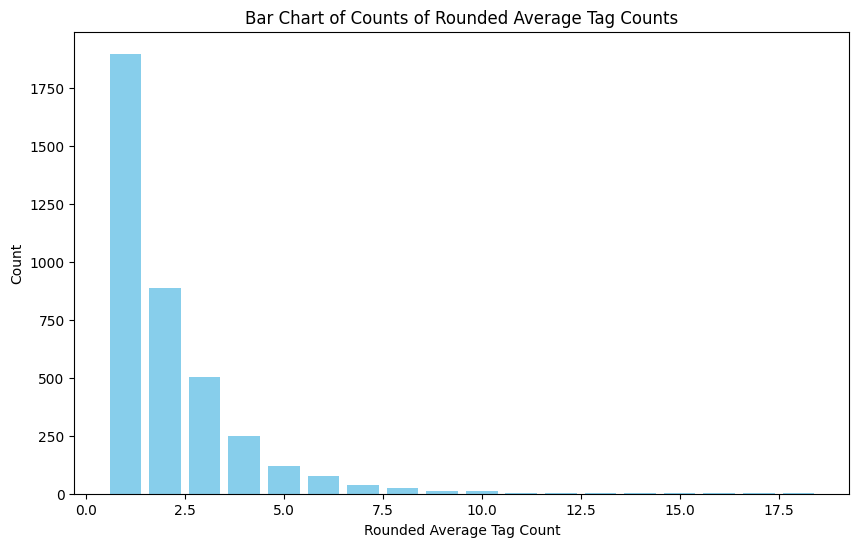

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd

# Group by 'userId' and 'movieId' to find duplicates
group_counts = movielens_tag_df.groupby(['userId', 'movieId']).size().reset_index(name='tag_count')

# Calculate the average number of tags per user
average_tag_counts_per_user = group_counts.groupby('userId')['tag_count'].mean().reset_index(name='average_tag_count')
average_tag_counts_per_user['average_tag_count_rounded'] = average_tag_counts_per_user['average_tag_count'].round()

# Count the occurrences of each rounded average
average_counts = average_tag_counts_per_user['average_tag_count_rounded'].value_counts().sort_index()

# Now, plot these counts as a bar chart
plt.figure(figsize=(10, 6))  # Set the figure size as desired
plt.bar(average_counts.index, average_counts.values, color='skyblue')  # Plot a bar chart

# Labeling the axes and title
plt.xlabel('Rounded Average Tag Count')
plt.ylabel('Count')
plt.title('Bar Chart of Counts of Rounded Average Tag Counts')

# Show the plot
plt.show()

## Group all tags from same user and movie

In [ ]:
# Group by 'userId' and 'movieId', and join the tags separated by a comma
movielens_grouped_tags_df = movielens_tag_df.groupby(['userId', 'movieId'])['tag'].agg(', '.join).reset_index()

# Now 'grouped_tags' will have the unique pairs of 'userId' and 'movieId' with all their tags combined
# in a single string separated by commas in the 'tag' column
print(movielens_grouped_tags_df)

       userId  movieId                                                tag
0          18     4141                                        Mark Waters
1          65      208                                          dark hero
2          65      353                                          dark hero
3          65      521                                      noir thriller
4          65      592                                          dark hero
...       ...      ...                                                ...
81271  138446     3489          Peter Pan, soundtrack, visually appealing
81272  138446     7045  family friendly, Scary Movies To See on Halloween
81273  138446     7164                      Peter Pan, visually appealing
81274  138446    55999                dragged, Jason Bateman, quirky, sad
81275  138472      923                                      rise to power

[81276 rows x 3 columns]


## check for duplicates in rating df


In [ ]:
groups = movielens_rating_df.groupby(['movieId', 'userId'])

# Count occurrences in each group
group_counts = groups.size().reset_index(name='Count')

# Filter and display duplicates
duplicates = group_counts[group_counts['Count'] > 1]
print("Duplicates:")
print(duplicates)


Duplicates:
Empty DataFrame
Columns: [movieId, userId, Count]
Index: []


## Merge Datasets

In [ ]:
movielens_rating_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10030194 entries, 175 to 19999807
Data columns (total 4 columns):
 #   Column           Dtype         
---  ------           -----         
 0   userId           int64         
 1   movieId          int64         
 2   rating           float64       
 3   timestamp_rated  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(2)
memory usage: 382.6 MB


In [ ]:
ML_merged_df = movielens_rating_df.merge(movielens_grouped_tags_df, on=['userId', 'movieId'], how='left')
ML_merged_df = ML_merged_df.merge(movielens_movie_df, on=['movieId'], how='left')
ML_merged_df = ML_merged_df.merge(movielens_link_df, on=['movieId'], how='left')

ML_merged_df.head()

,userId,movieId,rating,timestamp_rated,tag,title,genres,imdbId,tmdbId
0,2,3,4.0,2000-11-21 15:34:49,NaN,Grumpier Old Men (1995),Comedy|Romance,113228,15602
1,2,62,5.0,2000-11-21 15:29:58,NaN,Mr. Holland's Opus (1995),Drama,113862,2054
2,2,70,5.0,2000-11-21 15:31:31,NaN,From Dusk Till Dawn (1996),Action|Comedy|Horror|Thriller,116367,755
3,2,110,4.0,2000-11-21 15:30:58,NaN,Braveheart (1995),Action|Drama|War,112573,197
4,2,242,3.0,2000-11-21 15:32:56,NaN,Farinelli: il castrato (1994),Drama|Musical,109771,10954


In [ ]:
get_missing_values_info(ML_merged_df)

Length of df: 10030194
Columns With Missing Values: 1
Total Columns: 9
Percent of Columns with Missing Values: 11.1%


,Count Missing,Percent Missing
tag,9966938,99.4


In [ ]:
groups = ML_merged_df.groupby(['movieId', 'userId'])

# Count occurrences in each group
group_counts = groups.size().reset_index(name='Count')

# Filter and display duplicates
duplicates = group_counts[group_counts['Count'] > 1]
print("Duplicates:")
print(duplicates)


Duplicates:
Empty DataFrame
Columns: [movieId, userId, Count]
Index: []


In [ ]:
print('Unique users: ', ML_merged_df['userId'].nunique())

Unique users:  69246


In [ ]:
ML_merged_df.to_csv('movielens/ML_merged_df.csv', index=False)  # Use index=False to exclude the index column

In [ ]:
ML_merged_df.to_csv('movielens/10M_ML_merged_df.csv', index=False)  # Use index=False to exclude the index column

## EDA

# Merge Movielens & TMDB

In [5]:
import pandas as pd

tmdb_merged_df = pd.read_csv('tmdb/tmdb_merged_cleaned.csv', keep_default_na=False)
tmdb_merged_df.rename(columns={'title': 'tmdb_title'}, inplace=True)

ml_merged_df = pd.read_csv('movielens/10M_ML_merged_df.csv', keep_default_na=False)
ml_merged_df.rename(columns={'title': 'ml_title'}, inplace=True)

In [10]:
tmdb_merged_df.columns

Index(['movie_id', 'tmdb_title', 'cast', 'crew', 'budget', 'genres',
       'homepage', 'id', 'keywords', 'original_language', 'original_title',
       'overview', 'popularity', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'tagline', 'vote_average', 'vote_count',
       'overview_embedding'],
      dtype='object')

In [12]:
tmdb_merged_df = tmdb_merged_df.drop(['overview_embedding'], axis=1)

In [ ]:
ml_tmdb_merged_df = ml_merged_df.merge(tmdb_merged_df, left_on=['tmdbId'], right_on=['movie_id'], how='inner')
ml_tmdb_merged_df.info()

In [ ]:
print('Unique users: ', ml_tmdb_merged_df['userId'].nunique())

Unique users:  69246


In [ ]:
ml_tmdb_merged_df.head(10)

In [14]:
import pandas as pd

# Function to combine genres and remove duplicates
def combine_genres(row):
    genres_x = set(row['genres_x'].split(',')) if pd.notna(row['genres_x']) else set()
    genres_y = set(row['genres_y'].split(',')) if pd.notna(row['genres_y']) else set()
    combined_genres = genres_x.union(genres_y)
    return ', '.join(combined_genres)

# Apply the function to each row
ml_tmdb_merged_df['combined_genres'] = ml_tmdb_merged_df.apply(combine_genres, axis=1)

# Display the first few rows to verify
print(ml_tmdb_merged_df[['genres_x', 'genres_y', 'combined_genres']].head())


  genres_x              genres_y                combined_genres
0    Drama  Music, Drama, Family   Family, Drama,  Drama, Music
1    Drama  Music, Drama, Family   Family, Drama,  Drama, Music
2    Drama  Music, Drama, Family   Family, Drama,  Drama, Music
3    Drama  Music, Drama, Family   Family, Drama,  Drama, Music
4    Drama  Music, Drama, Family   Family, Drama,  Drama, Music


In [15]:
ml_tmdb_merged_df = ml_tmdb_merged_df.drop(['genres_x', 'genres_y'], axis=1)

In [17]:
ml_tmdb_merged_df =ml_tmdb_merged_df.drop(['movieId', 'imdbId', 'id', 'movie_id', 'tmdb_title'], axis=1)

In [18]:
ml_tmdb_merged_df.to_csv('ml_tmdb_merged.csv', index=False)  # Use index=False to exclude the index column

# EDA on merged dataset

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Load the dataset
df = pd.read_csv('ml_tmdb_merged_df.csv')

In [ ]:
df.describe()

,userId,rating,tmdbId,budget,popularity,revenue,runtime,vote_average,vote_count
count,829339.000000,829339.000000,829339.000000,8.293390e+05,829339.000000,8.293390e+05,829339.000000,829339.000000,829339.000000
mean,68479.132626,3.559102,6958.556073,4.190498e+07,43.137104,2.091724e+08,119.009424,6.923547,1886.768652
std,40056.310429,1.042069,14642.079437,4.268276e+07,34.813346,2.484059e+08,24.359253,0.812577,2100.197743
min,25.000000,0.500000,5.000000,0.000000e+00,0.001117,0.000000e+00,25.000000,0.000000,0.000000
25%,33349.000000,3.000000,563.000000,1.100000e+07,18.422008,3.529447e+07,101.000000,6.400000,434.000000
50%,69797.000000,4.000000,1850.000000,2.800000e+07,34.759855,1.214632e+08,116.000000,7.000000,1050.000000
75%,103021.000000,4.000000,9535.000000,6.000000e+07,58.782359,3.043203e+08,131.000000,7.500000,2705.000000
max,138468.000000,5.000000,318040.000000,3.800000e+08,724.247784,2.787965e+09,338.000000,10.000000,13752.000000


In [ ]:
df['popularity'].median()

34.759855

In [ ]:
df.head()

,userId,movieId,rating,timestamp_rated,tag,ml_title,genres_x,imdbId,tmdbId,movie_id,...,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,vote_average,vote_count
0,25,21,3.5,2010-07-01 05:54:26,NaN,Get Shorty (1995),Comedy|Crime|Thriller,113161,8012,8012,...,"Jersey Films, Metro-Goldwyn-Mayer (MGM)",United States of America,1995-10-20,115101622,105.0,English,Released,"The mob is tough, but it’s nothing like show b...",6.4,302
1,26,21,4.0,1996-08-05 18:46:13,NaN,Get Shorty (1995),Comedy|Crime|Thriller,113161,8012,8012,...,"Jersey Films, Metro-Goldwyn-Mayer (MGM)",United States of America,1995-10-20,115101622,105.0,English,Released,"The mob is tough, but it’s nothing like show b...",6.4,302
2,69,21,3.0,1997-06-20 13:11:54,NaN,Get Shorty (1995),Comedy|Crime|Thriller,113161,8012,8012,...,"Jersey Films, Metro-Goldwyn-Mayer (MGM)",United States of America,1995-10-20,115101622,105.0,English,Released,"The mob is tough, but it’s nothing like show b...",6.4,302
3,245,21,5.0,1999-10-12 01:26:18,NaN,Get Shorty (1995),Comedy|Crime|Thriller,113161,8012,8012,...,"Jersey Films, Metro-Goldwyn-Mayer (MGM)",United States of America,1995-10-20,115101622,105.0,English,Released,"The mob is tough, but it’s nothing like show b...",6.4,302
4,247,21,4.0,1999-12-13 14:32:52,NaN,Get Shorty (1995),Comedy|Crime|Thriller,113161,8012,8012,...,"Jersey Films, Metro-Goldwyn-Mayer (MGM)",United States of America,1995-10-20,115101622,105.0,English,Released,"The mob is tough, but it’s nothing like show b...",6.4,302


##User rating behaviour

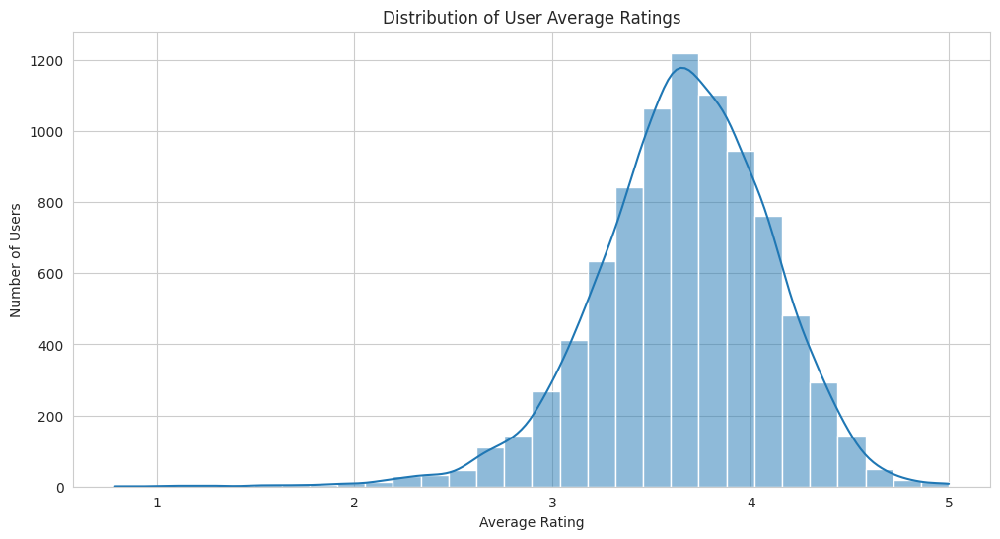

In [ ]:
user_rating_behavior = df.groupby('userId')['rating'].agg(['mean', 'std', 'count']).sort_values(by='mean', ascending=False)

# Plotting
plt.figure(figsize=(12, 6))
sns.histplot(user_rating_behavior['mean'], bins=30, kde=True)
plt.title('Distribution of User Average Ratings')
plt.xlabel('Average Rating')
plt.ylabel('Number of Users')
plt.show()


## Ratings over time

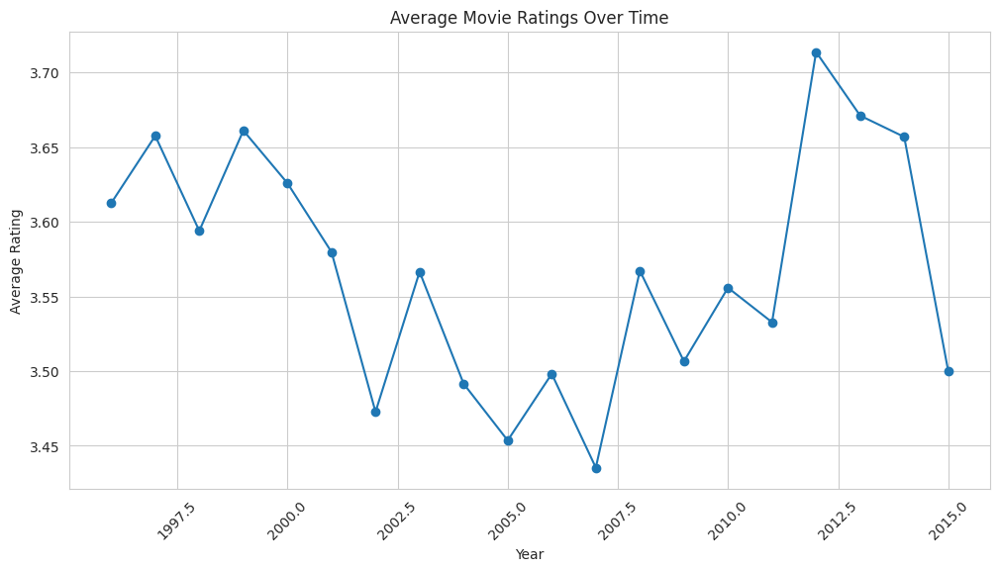

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Convert 'timestamp' to datetime
df['timestamp_rated'] = pd.to_datetime(df['timestamp_rated'])

# Group by year and calculate mean rating
yearly_avg = df.groupby(df['timestamp_rated'].dt.year)['rating'].mean().reset_index()

# Plotting ratings over time
plt.figure(figsize=(12, 6))
plt.plot(yearly_avg['timestamp_rated'], yearly_avg['rating'], marker='o')
plt.title('Average Movie Ratings Over Time')
plt.xlabel('Year')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.show()


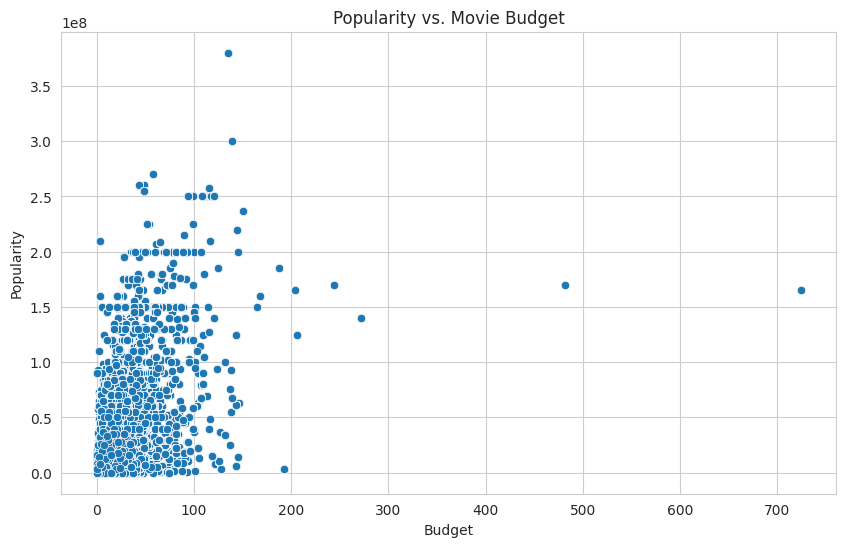

In [ ]:
# Scatter plot for budget vs popularity
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='popularity', y='budget')
plt.title('Popularity vs. Movie Budget')
plt.xlabel('Budget')
plt.ylabel('Popularity')
plt.show()


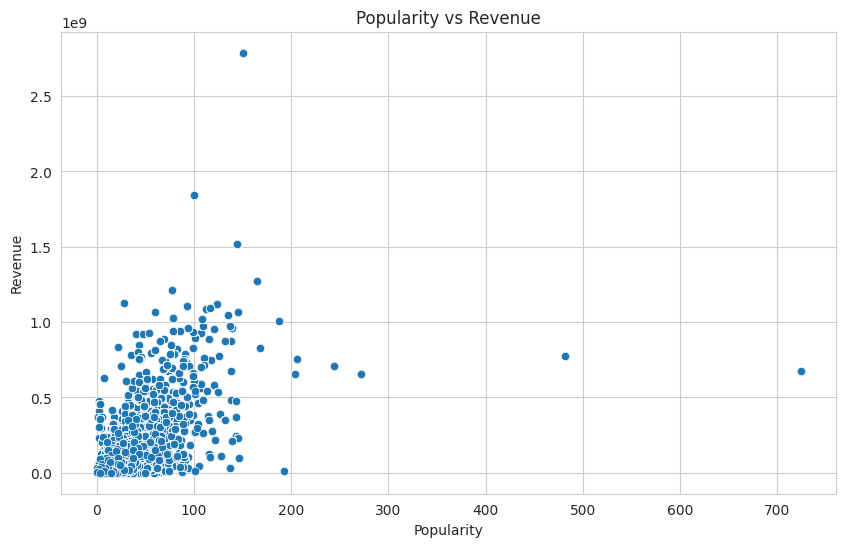

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='popularity', y='revenue', data=df)
plt.title('Popularity vs Revenue')
plt.xlabel('Popularity')
plt.ylabel('Revenue')
plt.show()


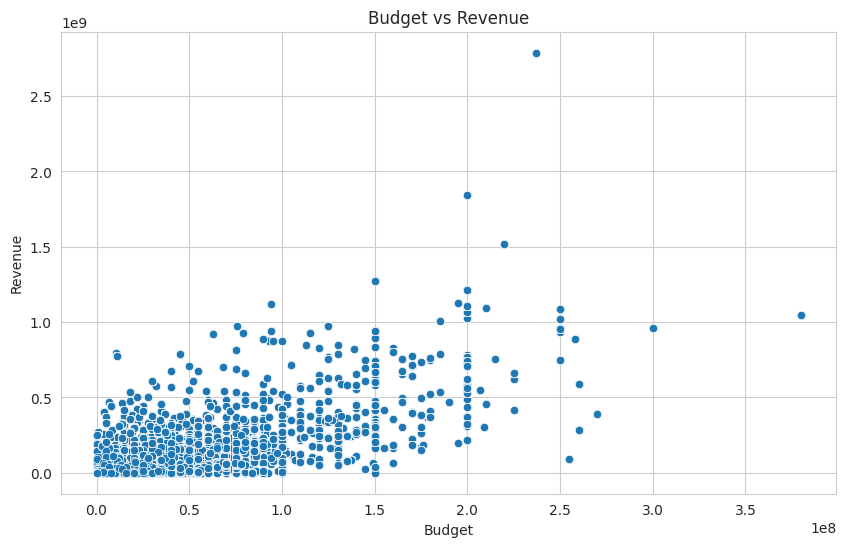

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='budget', y='revenue', data=df)
plt.title('Budget vs Revenue')
plt.xlabel('Budget')
plt.ylabel('Revenue')
plt.show()

## Runtime analysis

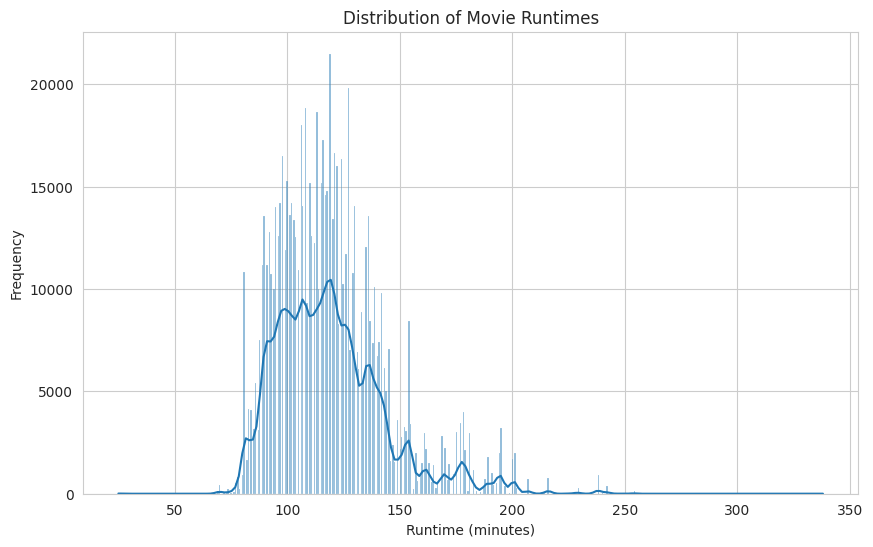

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['runtime'], kde=True)
plt.title('Distribution of Movie Runtimes')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Frequency')
plt.show()

## Genre analysis

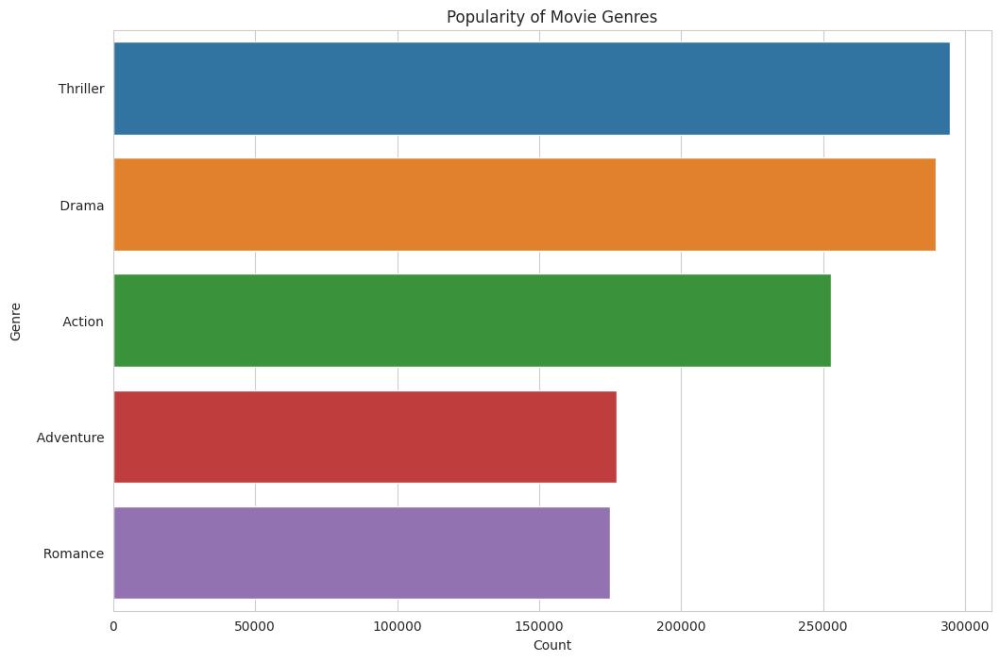

In [ ]:
# Assuming 'genres' is a comma-separated string of genres
genre_counts = df['combined_genres'].str.split(',').explode().value_counts()
top_5_genres = genre_counts.head(5)

plt.figure(figsize=(12, 8))
sns.barplot(y=top_5_genres.index, x=top_5_genres.values)
plt.title('Popularity of Movie Genres')
plt.xlabel('Count')
plt.ylabel('Genre')
plt.show()


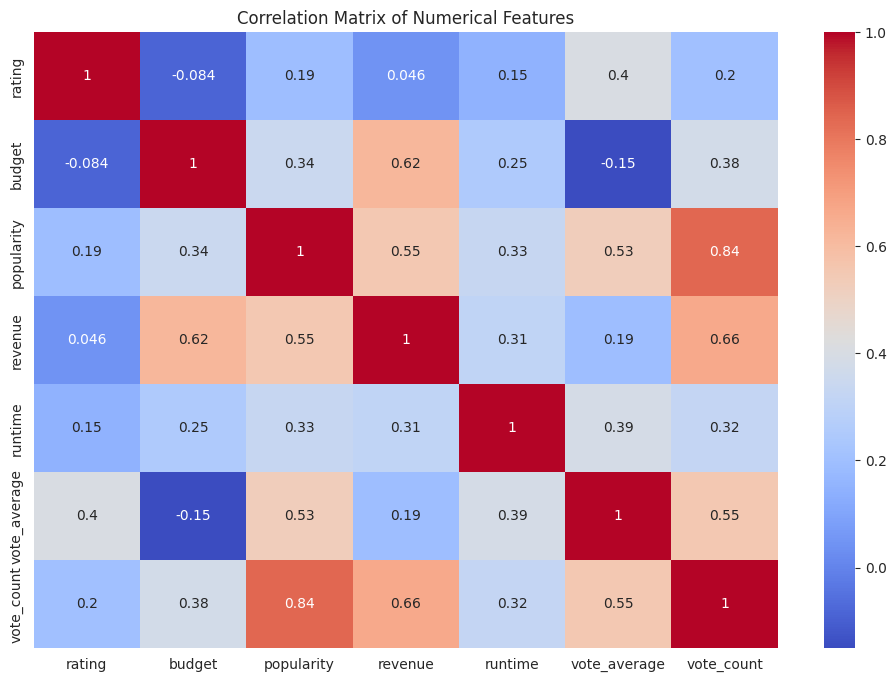

In [ ]:
# Select numerical features
df_dropped = df.drop(['userId', 'tmdbId'], axis=1)
numerical_features = df_dropped.select_dtypes(include=['int64', 'float64'])

# Correlation matrix
corr_matrix = numerical_features.corr()

# Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Numerical Features')
plt.show()


## TAGS

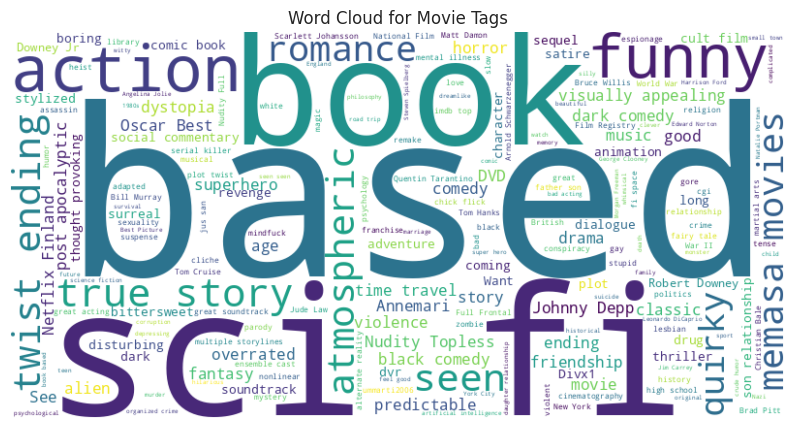

In [ ]:
from wordcloud import WordCloud

# Concatenate all tags into a single string
all_tags = ' '.join(df['tag'].dropna())

# Generate a word cloud image
wordcloud = WordCloud(background_color='white', width=800, height=400).generate(all_tags)

# Display the generated image
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Movie Tags')
plt.show()

## Keywords

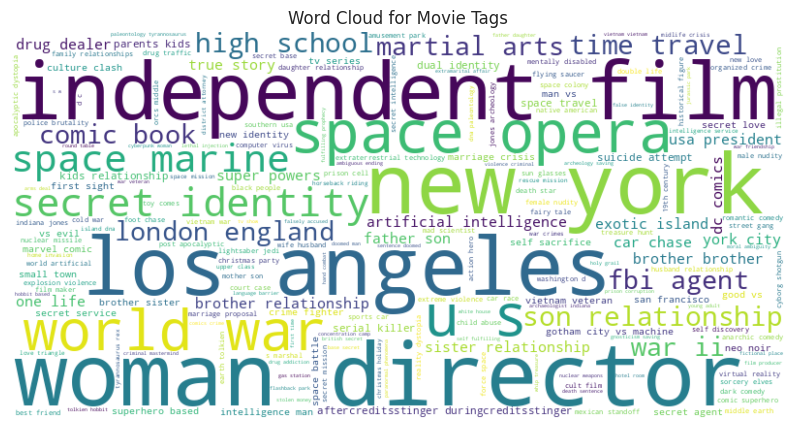

In [ ]:
# Concatenate all tags into a single string
all_tags = ' '.join(df['keywords'].dropna())

# Generate a word cloud image
wordcloud = WordCloud(background_color='white', width=800, height=400).generate(all_tags)

# Display the generated image
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Movie Tags')
plt.show()

## Release date analysis

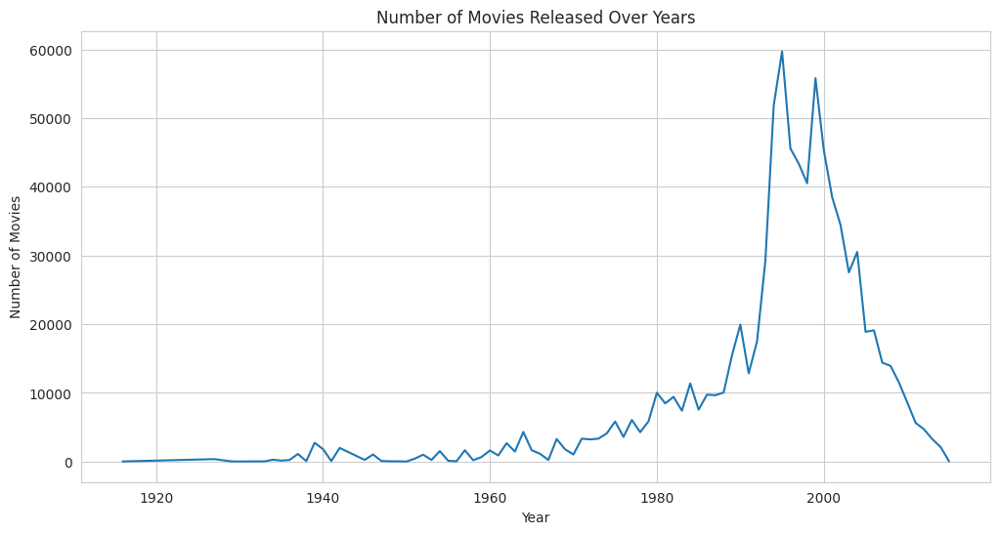

In [ ]:
df['release_year'] = pd.to_datetime(df['release_date']).dt.year
release_year_counts = df['release_year'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
sns.lineplot(x=release_year_counts.index, y=release_year_counts.values)
plt.title('Number of Movies Released Over Years')
plt.xlabel('Year')
plt.ylabel('Number of Movies')
plt.show()
